# Functional analysis of gene signatures

In [1]:
mkdir -p /mnt/storage/$USER/jupyternotebooks/assignment1/functional_analysis_gene_signatures/

In [25]:
cd /mnt/storage/$USER/jupyternotebooks/assignment1/functional_analysis_gene_signatures/

In [3]:
pwd

/mnt/storage/r0823712/jupyternotebooks/assignment1/functional_analysis_gene_signatures


In [4]:
ln -sf /mnt/storage/$USER/jupyternotebooks/assignment1/RNA-seq/deseq.results.tsv .

In [5]:
head deseq.results.tsv
#fold change, pvalue

	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
Podxl	23047.3263742249	2.30256409047557	0.0621641923789495	37.0400386839946	2.59809030498184e-300	4.30373659020241e-296
Chga	2168.94078744519	6.86723027446822	0.233859785097435	29.364733537265	1.54968640091818e-189	1.28352776156048e-185
Hsd3b1	3456.62840053675	9.80285254554275	0.350687398009068	27.9532501059227	6.01911183844263e-172	3.32355292012674e-168
Col3a1	47044.4256492803	1.32280282892632	0.0475703871923074	27.8072747984745	3.5424615209656e-170	1.46702187736988e-166
Col1a2	34824.4000986847	1.69770027334297	0.0633229542405145	26.8101874542165	2.45815065926444e-158	8.14385313414308e-155
Meg3	11845.8311170326	1.94586592055782	0.0782466377789379	24.8683646453317	1.63688366536707e-136	4.51916298613426e-133
Cdkn1c	56950.4351369868	1.50692956473074	0.0642079896655395	23.4695023560209	8.35876300834187e-122	1.97804156047404e-118
Igfbp7	5981.582449512	2.38326695910379	0.106208854777873	22.4394375034754	1.62284373037112e-111	3.36030079919971e-

In [6]:
head -1 deseq.results.tsv
grep -n Eya1 deseq.results.tsv
grep -n Six2 deseq.results.tsv
#-n, --line-number         print line number with output lines
#    --line-buffered       flush output on every line
# Eya1 and Six2 genes are strongly download-regulated (logFC < -2) and p.adj << 0.05

	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
22:Eya1	2567.67657145955	-3.67207136558722	0.218538123948416	-16.8028868338505	2.32449958666948e-63	1.83358741205619e-60
525:Six2	3485.31614802649	-4.58791380044839	0.834705101346938	-5.49644873745831	3.87515673184006e-08	1.22503761952158e-06


## Use arbitrary thresholds to create lists of up- and down-regulated genes

In [7]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print ;}' deseq.results.tsv | head
#filter fold change >1 and pvalue <0.05

	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
Podxl	23047.3263742249	2.30256409047557	0.0621641923789495	37.0400386839946	2.59809030498184e-300	4.30373659020241e-296
Chga	2168.94078744519	6.86723027446822	0.233859785097435	29.364733537265	1.54968640091818e-189	1.28352776156048e-185
Hsd3b1	3456.62840053675	9.80285254554275	0.350687398009068	27.9532501059227	6.01911183844263e-172	3.32355292012674e-168
Col3a1	47044.4256492803	1.32280282892632	0.0475703871923074	27.8072747984745	3.5424615209656e-170	1.46702187736988e-166
Col1a2	34824.4000986847	1.69770027334297	0.0633229542405145	26.8101874542165	2.45815065926444e-158	8.14385313414308e-155
Meg3	11845.8311170326	1.94586592055782	0.0782466377789379	24.8683646453317	1.63688366536707e-136	4.51916298613426e-133
Cdkn1c	56950.4351369868	1.50692956473074	0.0642079896655395	23.4695023560209	8.35876300834187e-122	1.97804156047404e-118
Igfbp7	5981.582449512	2.38326695910379	0.106208854777873	22.4394375034754	1.62284373037112e-111	3.36030079919971e-

In [9]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print $1}' deseq.results.tsv | grep -v baseMean > up-logFC1-p05.txt

In [10]:
awk '$3 != "NA" && $3 < -1 && $7 < 0.05 {print $1}' deseq.results.tsv | grep -v baseMean > down-logFC1-p05.txt

In [11]:
wc -l up-logFC1-p05.txt
wc -l down-logFC1-p05.txt

917 up-logFC1-p05.txt
352 down-logFC1-p05.txt


## mouseMine.org - create genes list

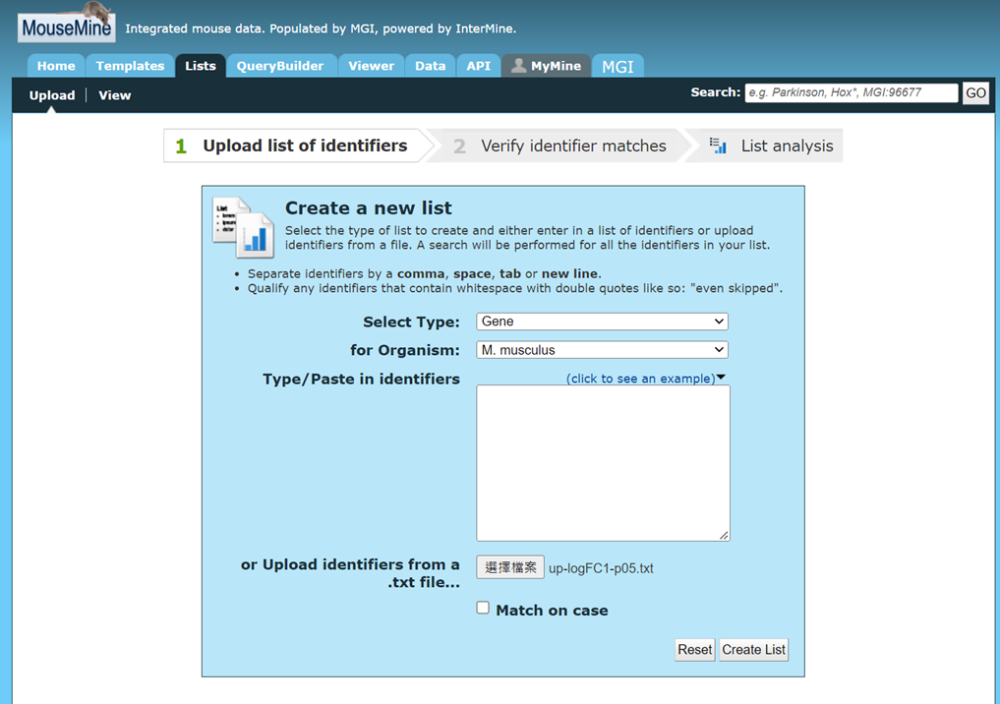

all 917 up-regulated genes are found


351 down-regulated genes are found
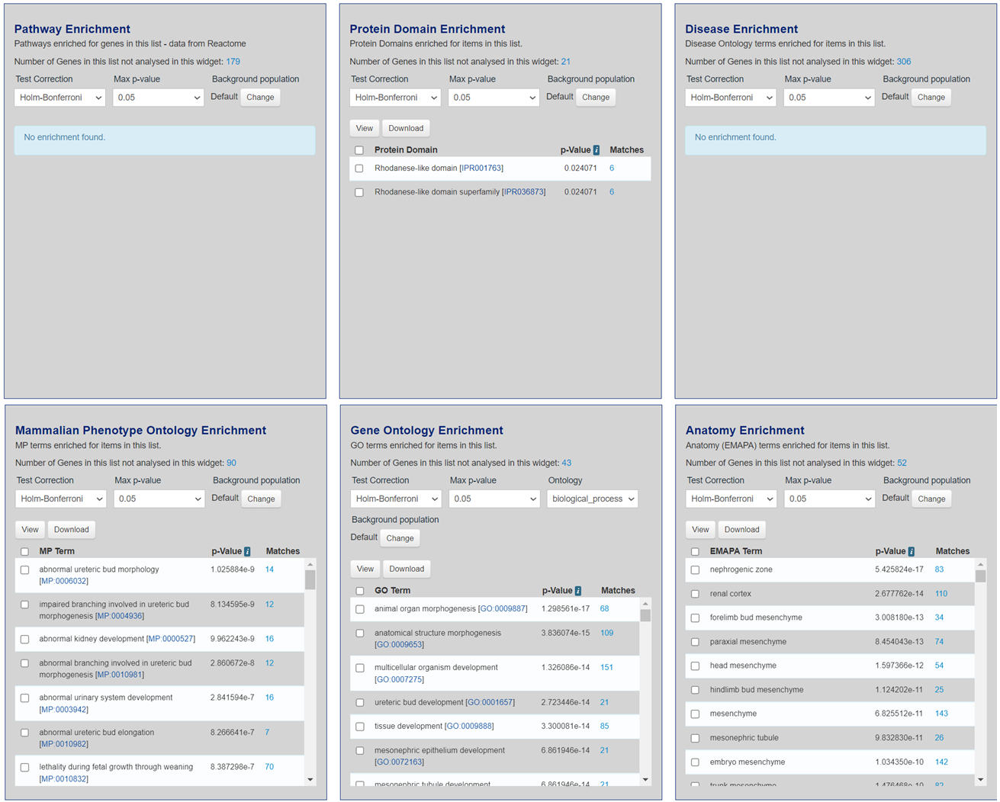

cannot find pathway enricment => use gProfilter

# gProfilter 
https://biit.cs.ut.ee/gprofiler/gost

up-logFC1-p05
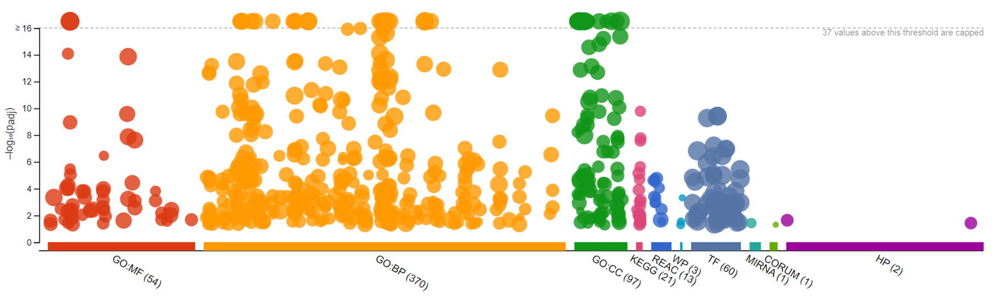

    MF: molecular function
    BP: biological process
    CC: cellular componen
    KEGG: pathway
    REAC: reactome pathway
    WP: wiki biological pathway
    TF: motif discovery, find potential uptream regulators which mofits are rich near these genes
    MIRNA: microRNA binding site which are in 3'UTR

The significantly up regulated genes are related to protein binding,system develop,cell periphery,myogenin motif,cortisol synthesis and secretion. 
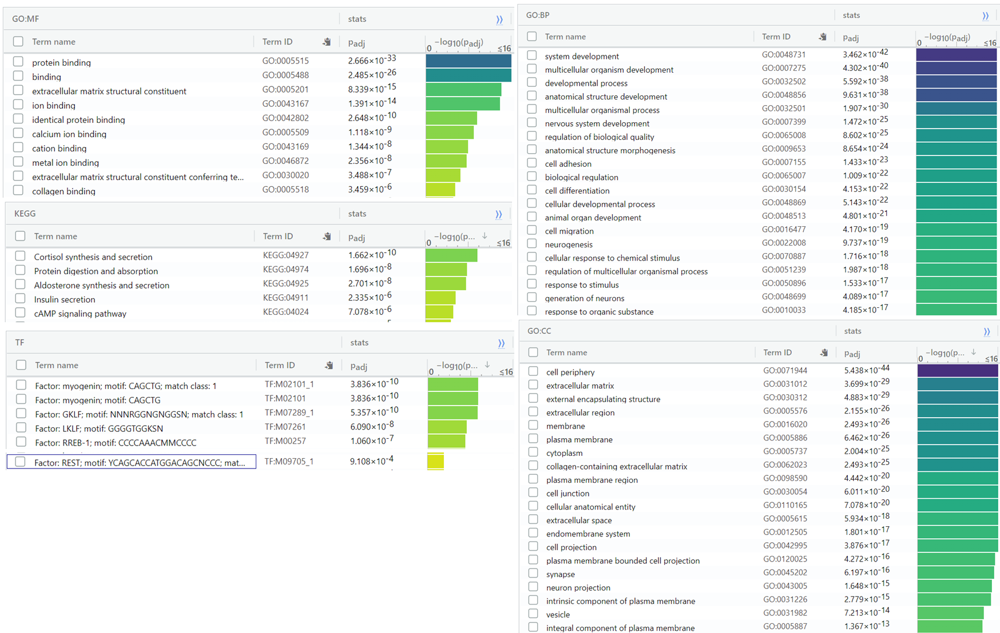

down-logFC1-p05
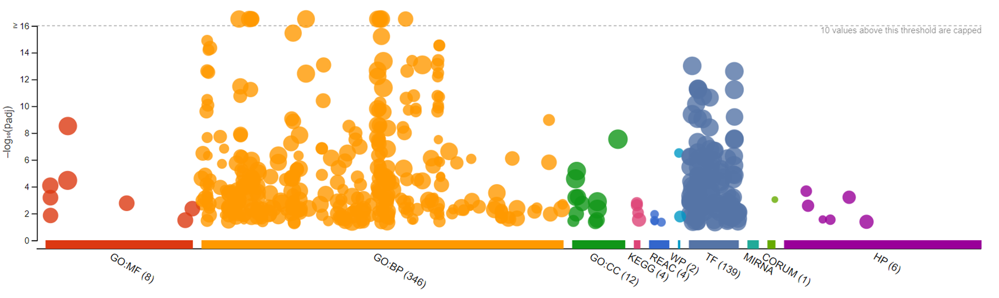

The significantly reduced expression genes are related to protein binding,anotomical structure development,cellular anatomical entity,BEN motif, and oocyte miosis.
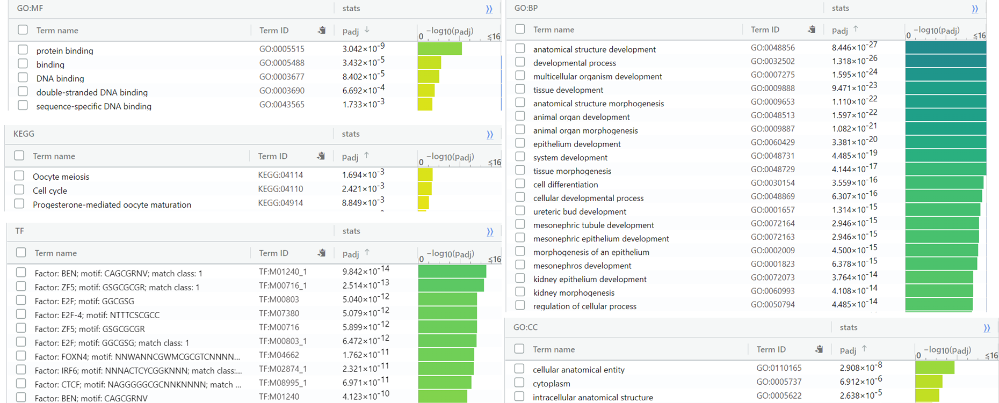

## Use the entire ranking to determine the "leading edge"

### GORilla

In [13]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene | head
# 3 => third column logFC
# gr => general sort, reverse

Arid3c
Gm6093
Cntnap5a
Ly6d
Plin1
Gm41279
Olfr32
Pramel3
Hsd3b1
Ccnb3
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [18]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene | grep -n Eya1

18301:Eya1


In [19]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCdesc.txt

Identify enriched GO terms with ranked gene names. Choose file -> deseq.results.sortFCdesc.txt

http://cbl-gorilla.cs.technion.ac.il/GOrilla/lqupm4zw/GOResults.html

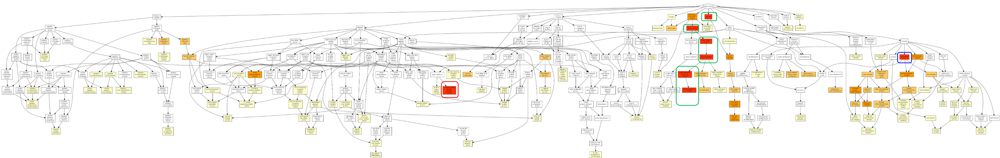

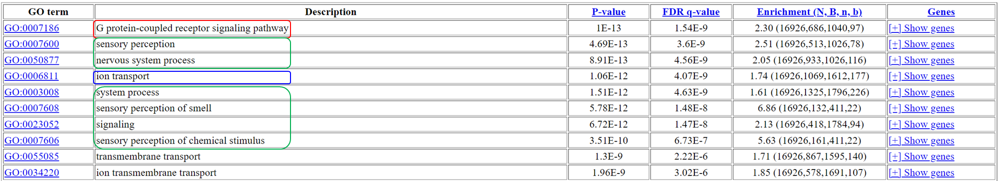

see G protein-coupled receptor signaling pathway
* Enrichment(16926,686,1040,97) \
    N: num of gene in the genome=16926\
    B: num of gene are involved in G protein-coupled receptor signaling pathway=686\
    n: num of the top genes = within the top 1040 genes related to G protein-coupled receptor signaling = leading edge\
    b: num of found genes = 97 genes related to G protein-coupled receptor signaling and is significant\
    expectd freq:868/16926 = 5%\
    obseved freq:97/1040 = 9%\
    Padj < 0.05

Do the same, but now for a ranked list in ascending order (most down-regulated gene on top):

In [20]:
cat deseq.results.tsv | sort -k3,3g | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCasc.txt

In [21]:
head deseq.results.sortFCasc.txt 

baseMean
Crlf1
Dmrta2
Rnase12
E030013I19Rik
Btn2a2
Tent5b
Slco4a1
Rxfp3
Gnat1


In [24]:
grep -n Eya1 deseq.results.sortFCasc.txt 
grep -n Eya1 deseq.results.sortFCdesc.txt

1252:Eya1
18301:Eya1


http://cbl-gorilla.cs.technion.ac.il/GOrilla/5pck76mr/GOResults.html
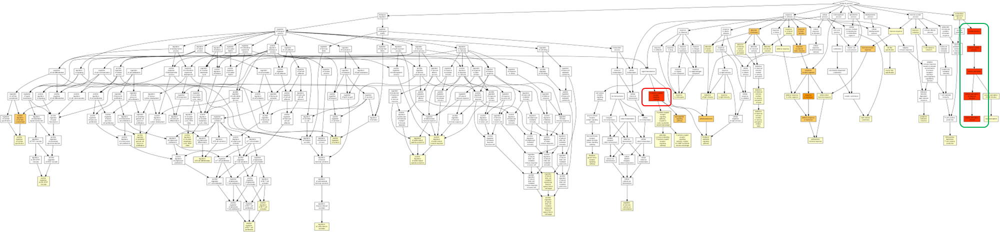

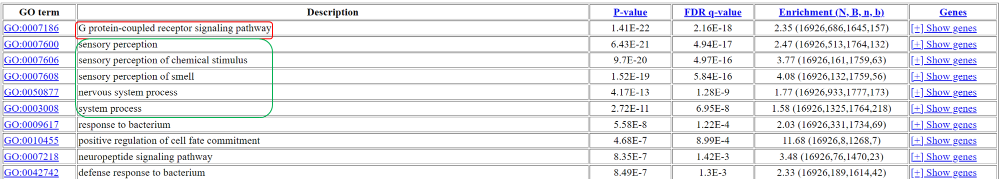

Both the significant up and down-regulated genes are aoosicated with <b>G protein-coupled receptor signaling and nervous system about sensory perception.

### GSEA : Gene Set Enrichment Analysis
A ranking-based enrichment analysis.

In [25]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | head

Arid3c 22.8909022799918
Gm6093 11.0717200427381
Cntnap5a 10.9009377938527
Ly6d 10.5542044050895
Plin1 10.2986816478567
Gm41279 10.196498663342
Olfr32 10.0762495350956
Pramel3 10.0687548983486
Hsd3b1 9.80285254554275
Ccnb3 9.71201041660255
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [23]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | grep -v baseMean | tr ' ' '\t' > deseq.logFC.rnk

In [24]:
grep -n Eya1 deseq.logFC.rnk
#-n => gives the line number

18301:Eya1	-3.67207136558722


In [20]:
head deseq.logFC.rnk

Arid3c	22.8909022799918
Gm6093	11.0717200427381
Cntnap5a	10.9009377938527
Ly6d	10.5542044050895
Plin1	10.2986816478567
Gm41279	10.196498663342
Olfr32	10.0762495350956
Pramel3	10.0687548983486
Hsd3b1	9.80285254554275
Ccnb3	9.71201041660255


download deseq.logFC.rnk-> load data-> browse for file-> ok-> run GSEA preRank -> Gene sets database: use "Reactome" (mouse no KEGG)-> run
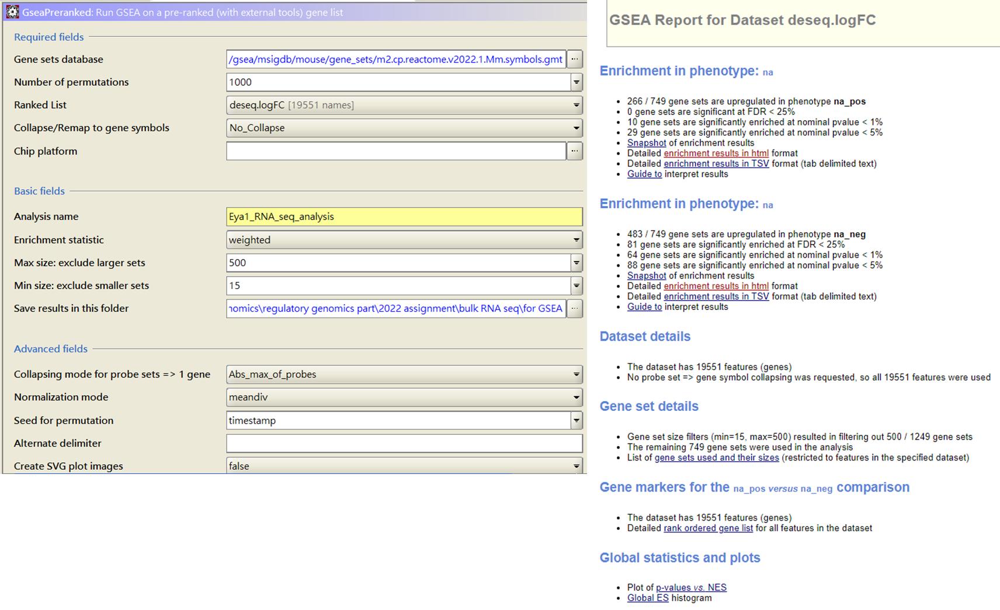

In the top part (na_pos), the genes related to receptor-type tyrosine-protein phosphatases, neurotransmitter, SMAD(regulates cellular processes) and nuclear receptor transcription pathway are enriched.

Positive
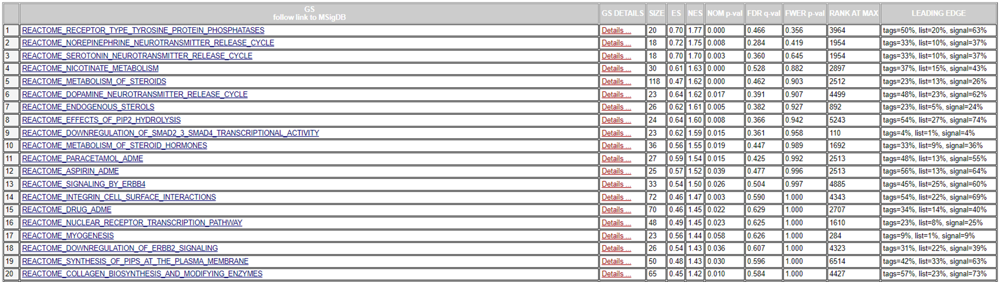

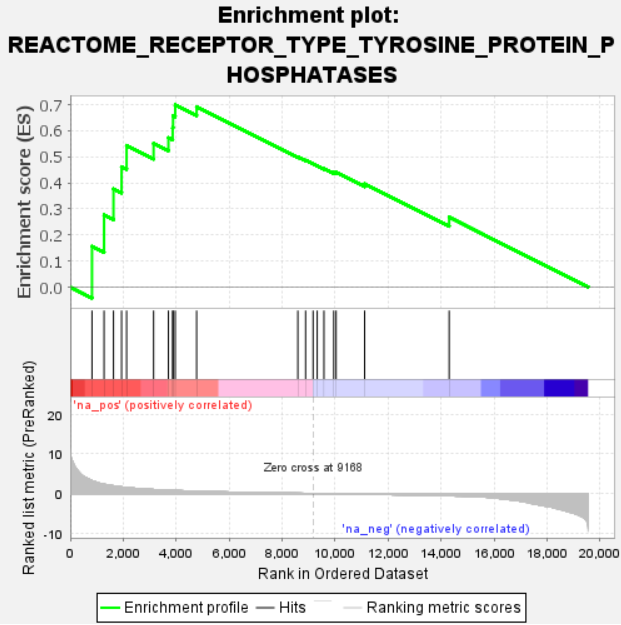\
most genes are up-regulated

In the negative part, FGFR2(bone growth), FGFR4 (conduct signal), FGFR1 (neurons formation) and Chromosome maintenance
associated pathways are significantly enriched.

Negative
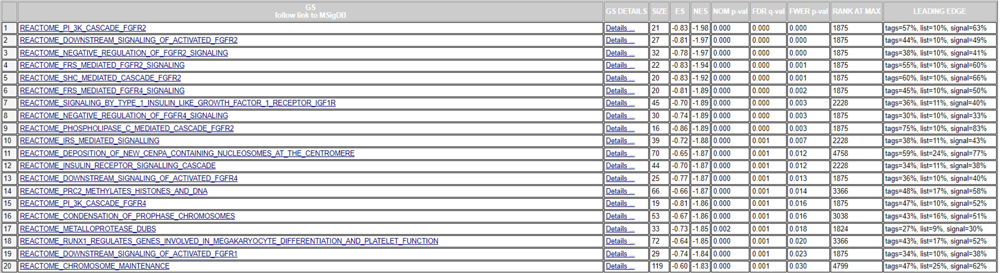

# Motif discovery ; upstream TF identification

Find enriched transcription factor motifs in the upstream (and intronic, downstream) sequences of this gene set.

In Cytoscape, do File->Import->Network->File, and choose the text file with all the up-regulated genes --> run iRegulon.

The highest motif is homer and the second is REST. They have the same seed motif sequence.
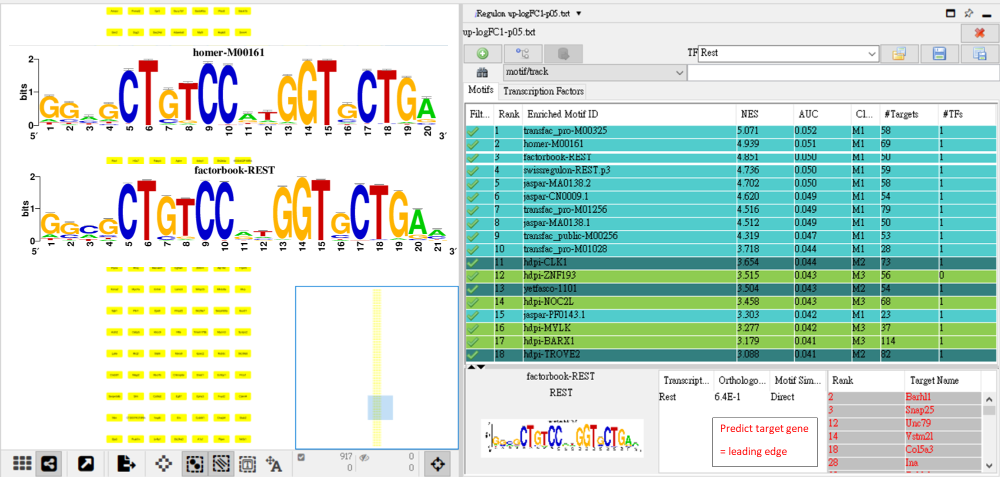

A network of predicted REST targets 
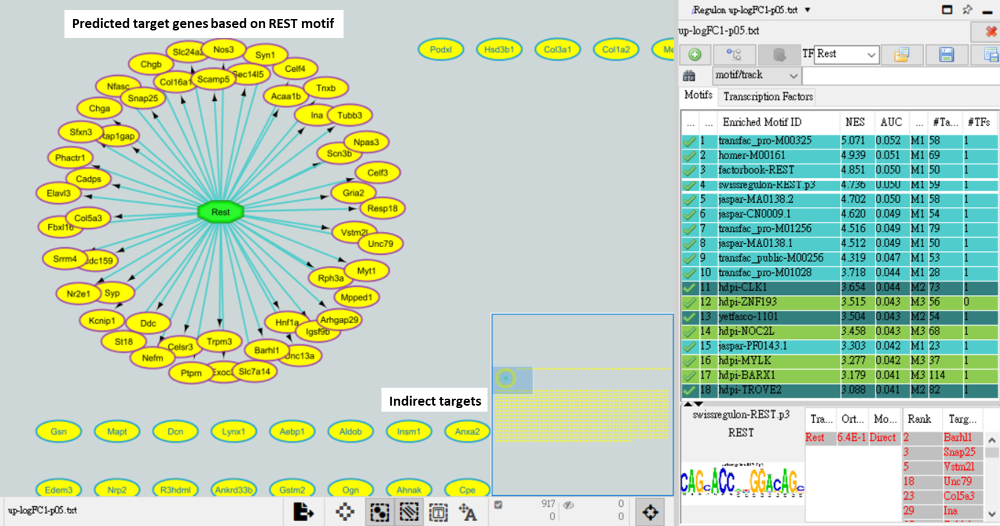

### PANTHER pie chart
http://www.pantherdb.org/geneListAnalysis.do \
use pie chart to show all REST target gene in iRegulon belong to which GO term

http://www.pantherdb.org/chart/pantherChart.jsp?listType=1&filterLevel=1&type=2&chartType=1&save=yes&basketItems=all&zoom=1&trackingId=2FA66AE416778B311F21209C8E0600CE

cellular process 24.2%, 18.0% biological regulation
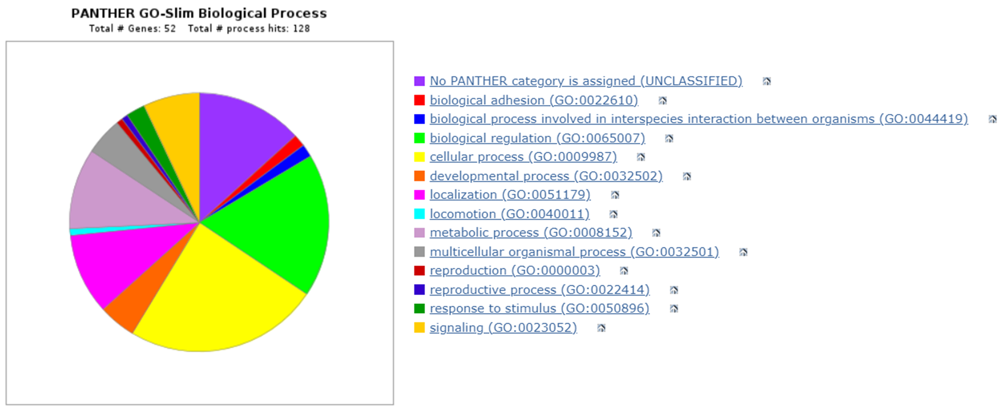

## Conclusion

### arbitrary threshold (log2Fold change >1 and pvalue <0.05)
1269 differentially expressed genes were found (917 upregulated genes and 352 downregulated genes in knock-out group)
* gProfilter\
up => are related to protein binding,system develop,cell periphery,myogenin motif,cortisol synthesis and secretion.\
down => are related to protein binding,anotomical structure development,cellular anatomical entity,BEN motif, and oocyte miosis.

### entire ranking to determine the "leading edge"
* GORilla\
up/down => G protein-coupled receptor signaling pathway, and neuron ion transport
* Gene Set Enrichment Analysis\
up => receptor-type tyrosine-protein phosphatases, neurotransmitter, SMAD(regulates cellular processes) and nuclear receptor transcription pathway\
down => FGFR2(bone growth), FGFR4 (conduct signal), FGFR1 (neurons formation) and Chromosome maintenance associated pathways

Using leading edge is sometimes better than arbitrary threshold, because the leading edge can identify some genes that are not in our selection of the arbitrary threshold (and everyone's threshold are different that cannot compare with each other)

I also use Vocano plot to identify the top 10 Padj of the significant genes\
=> knock-out Eya1 genes affect the Podxl, <b>Chga</b> and Pax2 expression which play an important role in kidney cell.

Intriguingly, the <b>Chga</b> is also a REST target gene (iRegulon), maybe Eya1 bind to Chga depend on REST trancription factor.  \
Although almost differencial expression gene are not associated with NPCs identity, at least we identify the Chga which is related to REST and Eya1. \
Maybe we can speculate this topic is a innovative filed and this research identified REST-binding motifs for the first time.